Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


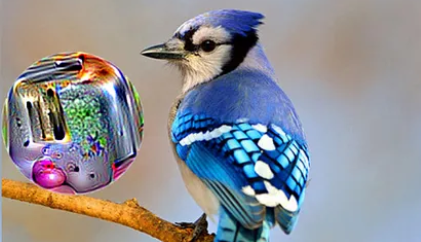

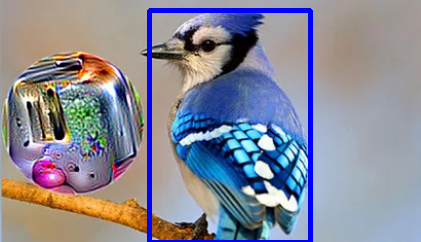

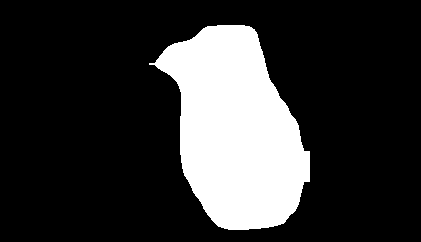

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')
# import cv2
# import numpy as np
# from google.colab.patches import cv2_imshow

# img = cv2.imread('/content/Screenshot 2023-11-25 125630.png')
# cv2_imshow(img)

# height, width, _ = img.shape

# blank_image = np.zeros((height, width, 3))

# # Loading Mask RCNN
# net = cv2.dnn.readNetFromTensorflow("/content/drive/MyDrive/rcnn mask/frozen_inference_graph_coco.pb",
#                                     "/content/drive/MyDrive/rcnn mask/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt")

# # Detect objects
# blob = cv2.dnn.blobFromImage(img, swapRB=True)
# net.setInput(blob)
# boxes, masks = net.forward(["detection_out_final", "detection_masks"])
# detection_count = boxes.shape[2]

# for i in range(detection_count):
#     box = boxes[0, 0, i]
#     class_id = box[1]
#     score = box[2]

#     if score < 0.5:
#         continue

#     # Get box coordinates
#     x = int(box[3] * width)
#     y = int(box[4] * height)
#     x2 = int(box[5] * width)
#     y2 = int(box[6] * height)

#     roi = blank_image[y: y2, x: x2]
#     roi_height, roi_width, _ = roi.shape

#     # Get the mask
#     mask = masks[i, int(class_id)]
#     mask = cv2.resize(mask, (roi_width, roi_height))
#     _, mask = cv2.threshold(mask, 0.5, 255, cv2.THRESH_BINARY)

#     cv2.rectangle(img, (x, y), (x2, y2), (255, 0, 0), 3)

#     # Get mask coordinates
#     contours, _ = cv2.findContours(np.array(mask, np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     for cnt in contours:
#         cv2.fillPoly(roi, [cnt], (255, 255, 255))  # Fill polygons in blank_image

# cv2_imshow(img)
# cv2_imshow(blank_image)


## Attacked Image

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.morphology import disk, binary_dilation
# from skimage.restoration import inpaint
# from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# # Step 1: Use ResNet-50 for image classification
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# image_orig = cv2.imread(image_path)
# image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# # Preprocess the image for ResNet-50
# image_resized = np.expand_dims(image_resized, axis=0)
# image_resized = preprocess_input(image_resized)

# # Load pre-trained ResNet-50 model
# resnet_model = ResNet50(weights='imagenet')

# # Get predictions
# predictions = resnet_model.predict(image_resized)
# decoded_predictions = decode_predictions(predictions, top=4)[0]

# # Display top 4 predictions
# print("Top 4 predictions:")
# for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
#     print(f"{i + 1}: {label} ({score:.2f})")


1/1 [==============================] - 2s 2s/step
Top 4 predictions:
1: toaster (0.68)
2: soap_dispenser (0.09)
3: piggy_bank (0.03)
4: partridge (0.02)


# Sampled Inpainting

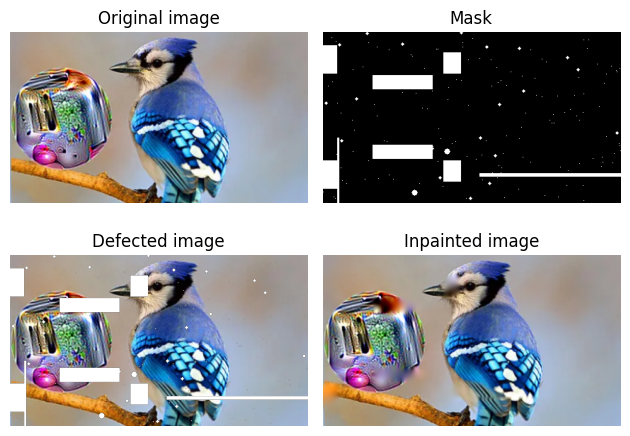

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# from skimage import data
# from skimage.morphology import disk, binary_dilation
# from skimage.restoration import inpaint

# image_orig = plt.imread('/content/Screenshot 2023-11-25 125630.png')

# # Create mask with six block defect regions
# mask = np.zeros(image_orig.shape[:-1], dtype=bool)
# mask[20:60, 0:20] = 1
# mask[160:180, 70:155] = 1
# mask[30:60, 170:195] = 1
# mask[-60:-30, 170:195] = 1
# mask[-180:-160, 70:155] = 1
# mask[-60:-20, 0:20] = 1

# # Add a few long, narrow defects
# mask[200:205, -200:] = 1
# mask[150:255, 20:23] = 1
# mask[365:368, 60:130] = 1

# # Add randomly positioned small point-like defects
# rstate = np.random.default_rng(0)
# for radius in [0, 2, 4]:
#     # larger defects are less common
#     thresh = 3 + 0.25 * radius  # make larger defects less common
#     tmp_mask = rstate.standard_normal(image_orig.shape[:-1]) > thresh
#     if radius > 0:
#         tmp_mask = binary_dilation(tmp_mask, disk(radius, dtype=bool))
#     mask[tmp_mask] = 1

# # Apply defect mask to the image over the same region in each color channel
# image_defect = image_orig * ~mask[..., np.newaxis]

# image_result = inpaint.inpaint_biharmonic(image_defect, mask, channel_axis=-1)

# fig, axes = plt.subplots(ncols=2, nrows=2)
# ax = axes.ravel()

# ax[0].set_title('Original image')
# ax[0].imshow(image_orig)

# ax[1].set_title('Mask')
# ax[1].imshow(mask, cmap=plt.cm.gray)

# ax[2].set_title('Defected image')
# ax[2].imshow(image_defect)

# ax[3].set_title('Inpainted image')
# ax[3].imshow(image_result)

# for a in ax:
#     a.axis('off')

# fig.tight_layout()
# plt.show()

In [ ]:
output_path_matplotlib = '/content/inpainted.png'
plt.imsave(output_path_matplotlib, image_result)

## Checking the probabilties now

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk, binary_dilation
from skimage.restoration import inpaint
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)

# Load pre-trained ResNet-50 model
resnet_model = ResNet50(weights='imagenet')

# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")


1/1 [==============================] - 1s 1s/step
Top 4 predictions:
1: toaster (0.46)
2: brambling (0.14)
3: jay (0.03)
4: partridge (0.03)


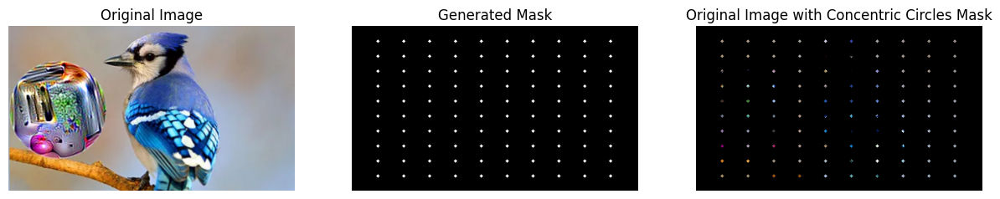

In [ ]:
# import cv2
# import numpy as np
# from matplotlib import pyplot as plt

# # Load the image
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# original_image = cv2.imread(image_path)

# # Create a black mask with the same size as the original image
# mask = np.zeros_like(original_image, dtype=np.uint8)

# # Set parameters for the circles
# num_circles_horizontal = 10
# num_circles_vertical = 10
# circle_radius = 2
# # Calculate the spacing between circles
# spacing_horizontal = original_image.shape[1] // (num_circles_horizontal + 1)
# spacing_vertical = original_image.shape[0] // (num_circles_vertical + 1)

# # Generate concentric circles in a grid
# for i in range(num_circles_horizontal):
#     for j in range(num_circles_vertical):
#         center = ((i + 1) * spacing_horizontal, (j + 1) * spacing_vertical)
#         color = (255, 255, 255)  # White color
#         cv2.circle(mask, center, circle_radius, color, -1)  # -1 fills the circle

# # Apply the mask to the original image
# masked_image = cv2.bitwise_and(original_image, mask)

# # Display the original image, mask, and the masked image
# fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# ax[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
# ax[0].set_title('Original Image')
# ax[0].axis('off')

# ax[1].imshow(mask, cmap='gray')
# ax[1].set_title('Generated Mask')
# ax[1].axis('off')

# ax[2].imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
# ax[2].set_title('Original Image with Concentric Circles Mask')
# ax[2].axis('off')

# plt.show()


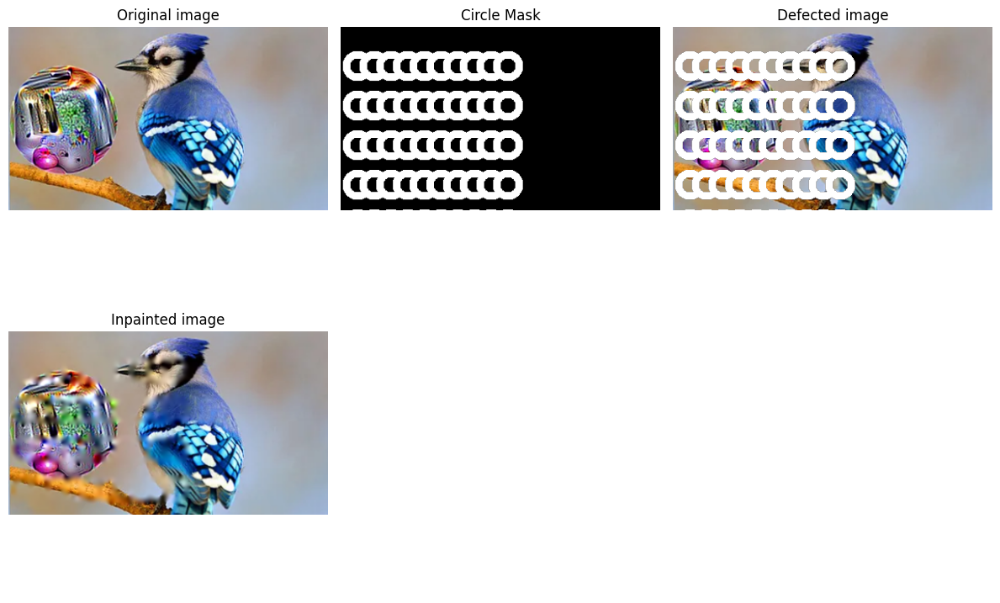

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.morphology import disk, binary_dilation
# from skimage.draw import disk as draw_disk
# from skimage.restoration import inpaint

# # Load the image
# image_orig = plt.imread('/content/Screenshot 2023-11-25 125630.png')

# # Create a black mask with the same size as the original image
# mask = np.zeros(image_orig.shape[:-1], dtype=bool)

# # Set parameters for concentric circles
# num_circles_horizontal = 7
# num_circles_vertical = 10
# outer_radius = 20# 2 cm radius
# inner_radius = 10# 1 cm radius

# # Calculate the spacing between circles
# spacing_horizontal = image_orig.shape[1] // (num_circles_horizontal + 1)
# spacing_vertical = image_orig.shape[0] // (num_circles_vertical + 1)

# # Generate concentric circles in a grid
# for i in range(num_circles_horizontal):
#     for j in range(num_circles_vertical):
#         center = ((i + 1) * spacing_horizontal, (j + 1) * spacing_vertical)

#         # Clip circle coordinates to be within the image size
#         outer_circle_coords = draw_disk(center, outer_radius, shape=image_orig.shape[:-1])
#         inner_circle_coords = draw_disk(center, inner_radius, shape=image_orig.shape[:-1])

#         # Draw outer circle
#         mask[outer_circle_coords] = 1

#         # Draw inner circle
#         mask[inner_circle_coords] = 0

# # Apply the circle mask to the image over the same region in each color channel
# image_defect = image_orig * ~mask[..., np.newaxis]

# # Inpaint using the circle mask
# image_result1 = inpaint.inpaint_biharmonic(image_defect, mask, channel_axis=-1)

# # Display the results
# fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(12, 8))
# ax = axes.ravel()

# ax[0].set_title('Original image')
# ax[0].imshow(image_orig)

# ax[1].set_title('Circle Mask')
# ax[1].imshow(mask, cmap=plt.cm.gray)

# ax[2].set_title('Defected image')
# ax[2].imshow(image_defect)

# ax[3].set_title('Inpainted image')
# ax[3].imshow(image_result1)

# for a in ax:
#     a.axis('off')

# fig.tight_layout()
# plt.show()


In [ ]:
output_path_matplotlib = '/content/inpainted_concentrate3.png'
plt.imsave(output_path_matplotlib, image_result1)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk, binary_dilation
from skimage.restoration import inpaint
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted_concentrate3.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)

# Load pre-trained ResNet-50 model
resnet_model = ResNet50(weights='imagenet')

# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")


1/1 [==============================] - 1s 1s/step
Top 4 predictions:
1: toaster (0.55)
2: soap_dispenser (0.13)
3: brambling (0.03)
4: partridge (0.03)


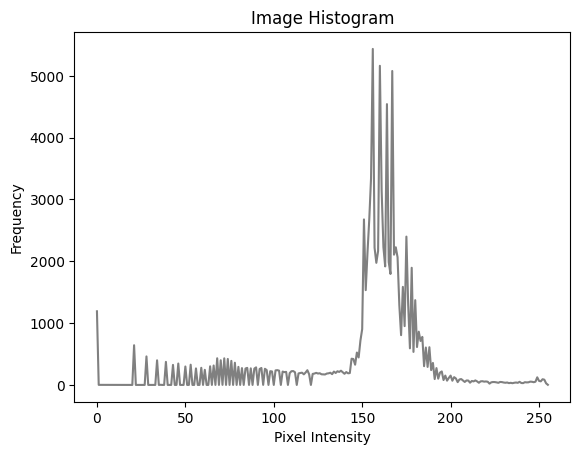

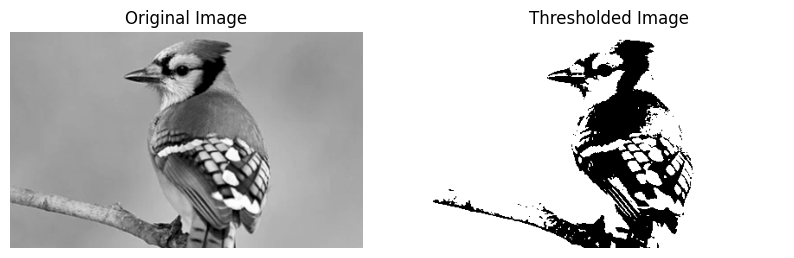

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Load the image
# image_path = '/content/real_image.png'  # Replace with the path to your image
# img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# # Create histogram
# hist, bins = np.histogram(img.flatten(), 256, [0, 256])

# # Plot the histogram
# plt.plot(hist, color='gray')
# plt.xlabel('Pixel Intensity')
# plt.ylabel('Frequency')
# plt.title('Image Histogram')
# plt.show()

# # Perform thresholding
# threshold_value = 128  # You can adjust this threshold value as needed
# _, thresholded_image = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)

# # Display the original and thresholded images using matplotlib
# plt.figure(figsize=(10, 5))

# plt.subplot(1, 2, 1)
# plt.imshow(img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(thresholded_image, cmap='gray')
# plt.title('Thresholded Image')
# plt.axis('off')

# plt.show()


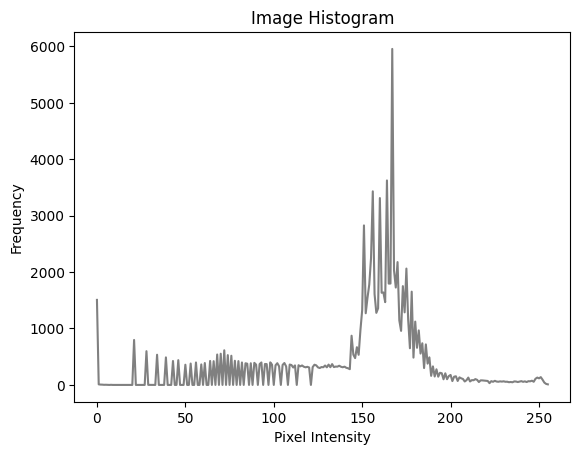

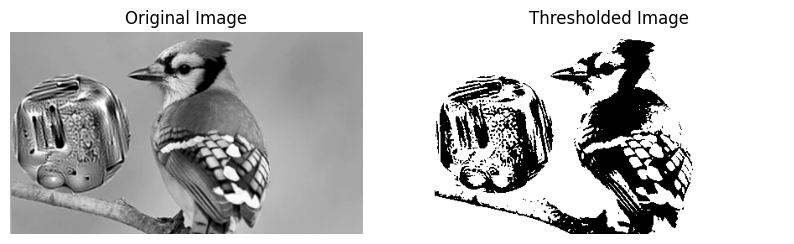

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Load the image
# image_path = '/content/Screenshot 2023-11-25 125630.png'  # Replace with the path to your image
# img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# # Create histogram
# hist, bins = np.histogram(img.flatten(), 256, [0, 256])

# # Plot the histogram
# plt.plot(hist, color='gray')
# plt.xlabel('Pixel Intensity')
# plt.ylabel('Frequency')
# plt.title('Image Histogram')
# plt.show()

# # Perform thresholding
# threshold_value = 128# You can adjust this threshold value as needed
# _, thresholded_image = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)

# # Display the original and thresholded images using matplotlib
# plt.figure(figsize=(10, 5))

# plt.subplot(1, 2, 1)
# plt.imshow(img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')

# plt.subplot(1, 2, 2)
# plt.imshow(thresholded_image, cmap='gray')
# plt.title('Thresholded Image')
# plt.axis('off')

# plt.show()


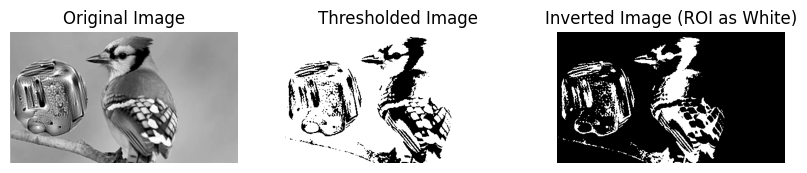

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Load the image
# image_path = '/content/Screenshot 2023-11-25 125630.png'  # Replace with the path to your image
# img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# # Perform thresholding
# threshold_value = 100# You can adjust this threshold value as needed
# _, thresholded_image = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)

# # Invert the binary image
# inverted_image = cv2.bitwise_not(thresholded_image)

# # Display the original and thresholded images using matplotlib
# plt.figure(figsize=(10, 5))

# plt.subplot(1, 3, 1)
# plt.imshow(img, cmap='gray')
# plt.title('Original Image')
# plt.axis('off')

# plt.subplot(1, 3, 2)
# plt.imshow(thresholded_image, cmap='gray')
# plt.title('Thresholded Image')
# plt.axis('off')

# plt.subplot(1, 3, 3)
# plt.imshow(inverted_image, cmap='gray')
# plt.title('Inverted Image (ROI as White)')
# plt.axis('off')

# plt.show()


In [ ]:
output_path_matplotlib = '/content/inverted.png'
plt.imsave(output_path_matplotlib, inverted_image)

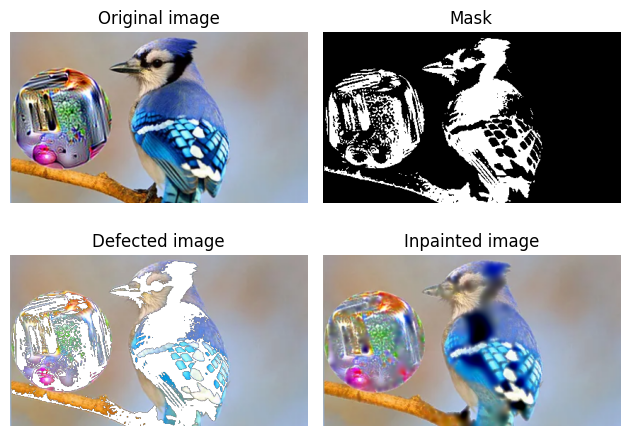

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# from skimage import data
# from skimage.morphology import disk, binary_dilation
# from skimage.restoration import inpaint

# image_orig = plt.imread('/content/Screenshot 2023-11-25 125630.png')

# # Create mask with six block defect regions
# mask = plt.imread('/content/inverted.png')
# mask = (mask > 0.5).astype(bool)  # Convert to boolean type

# # Ensure the mask has only one channel
# if mask.ndim == 3 and mask.shape[2] > 1:
#     mask = mask[:, :, 0]

# # Make a copy to ensure C-contiguity
# image_orig = np.ascontiguousarray(image_orig)
# mask = np.ascontiguousarray(mask)

# # Apply defect mask to the image over the same region in each color channel
# image_defect = image_orig * ~mask[..., np.newaxis]

# # Make a copy to ensure C-contiguity
# image_defect = np.ascontiguousarray(image_defect)

# image_result32 = inpaint.inpaint_biharmonic(image_defect, mask, channel_axis=-1)

# fig, axes = plt.subplots(ncols=2, nrows=2)
# ax = axes.ravel()

# ax[0].set_title('Original image')
# ax[0].imshow(image_orig)

# ax[1].set_title('Mask')
# ax[1].imshow(mask, cmap=plt.cm.gray)

# ax[2].set_title('Defected image')
# ax[2].imshow(image_defect)

# ax[3].set_title('Inpainted image')
# ax[3].imshow(image_result)

# for a in ax:
#     a.axis('off')

# fig.tight_layout()
# plt.show()


In [ ]:
output_path_matplotlib = '/content/inverted_painted.png'
plt.imsave(output_path_matplotlib, image_result32)

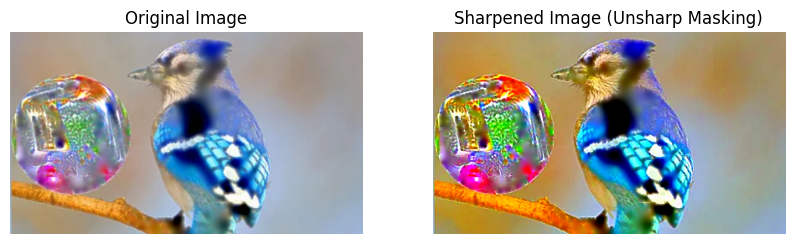

In [ ]:
# import matplotlib.pyplot as plt
# from skimage import img_as_ubyte, img_as_float
# from skimage.filters import unsharp_mask
# from skimage.io import imread
# from skimage import exposure

# # Read the original image
# image_orig = imread('/content/inverted_painted.png')

# # Convert the image to floating-point format for processing
# image_float = img_as_float(image_orig)

# # Apply unsharp masking for sharpening
# sharpened_image = unsharp_mask(image_float, radius=1, amount=1.5)

# # Convert the result back to uint8 format for display
# sharpened_image = img_as_ubyte(sharpened_image)

# # Display the results
# fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# axes[0].imshow(image_orig)
# axes[0].set_title('Original Image')
# axes[0].axis('off')

# axes[1].imshow(sharpened_image)
# axes[1].set_title('Sharpened Image (Unsharp Masking)')
# axes[1].axis('off')

# plt.show()


In [ ]:
output_path_matplotlib = '/content/inverted_painted_sharpened.png'
plt.imsave(output_path_matplotlib, sharpened_image)

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.morphology import disk, binary_dilation
# from skimage.restoration import inpaint
# from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# # Step 1: Use ResNet-50 for image classification
# image_path = '/content/inverted_painted_sharpened.png'
# image_orig = cv2.imread(image_path)
# image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# # Preprocess the image for ResNet-50
# image_resized = np.expand_dims(image_resized, axis=0)
# image_resized = preprocess_input(image_resized)

# # Load pre-trained ResNet-50 model
# resnet_model = ResNet50(weights='imagenet')

# # Get predictions
# predictions = resnet_model.predict(image_resized)
# decoded_predictions = decode_predictions(predictions, top=4)[0]

# # Display top 4 predictions
# print("Top 4 predictions:")
# for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
#     print(f"{i + 1}: {label} ({score:.2f})")


1/1 [==============================] - 1s 1s/step
Top 4 predictions:
1: bubble (0.64)
2: bee (0.06)
3: perfume (0.02)
4: mouse (0.02)


<ipython-input-105-b32b5ef29dab>:20: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  inpainted_image1 = inpaint.inpaint_biharmonic(sharpened_image_uint8, mask1, multichannel=True)
<ipython-input-105-b32b5ef29dab>:23: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  inpainted_image2 = inpaint.inpaint_biharmonic(inpainted_image1, mask2, multichannel=True)


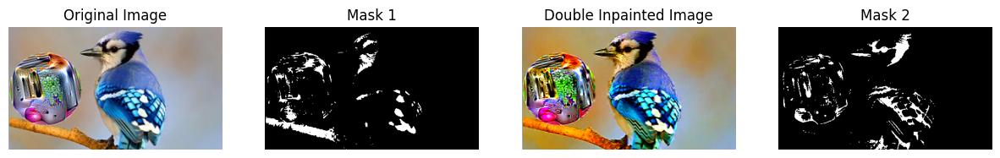

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.restoration import inpaint
# from skimage import img_as_ubyte, img_as_float
# from skimage.filters import unsharp_mask
# from skimage.io import imread
# from skimage.color import rgb2gray

# def double_inpainting(image, mask1, mask2, radius1=5, radius2=3, amount1=2.0, amount2=1.0):
#     # Convert the image to floating-point format for processing
#     image_float = img_as_float(image)

#     # Apply unsharp masking for sharpening before inpainting (optional)
#     sharpened_image = unsharp_mask(image_float, radius=1, amount=1.5)

#     # Convert the result back to uint8 format for inpainting
#     sharpened_image_uint8 = img_as_ubyte(sharpened_image)

#     # Perform the first inpainting using the first mask
#     inpainted_image1 = inpaint.inpaint_biharmonic(sharpened_image_uint8, mask1, multichannel=True)

#     # Perform the second inpainting using the second mask
#     inpainted_image2 = inpaint.inpaint_biharmonic(inpainted_image1, mask2, multichannel=True)

#     return inpainted_image2

# # Read the original image
# image_orig = imread('/content/Screenshot 2023-11-25 125630.png')

# # Create masks (you should replace these with your own masks or generate them as needed)
# mask1 = (image_orig[:, :, 0] > 200)  # Example mask 1
# mask2 = (image_orig[:, :, 1] < 50)   # Example mask 2

# # Apply double inpainting
# result_image_Q= double_inpainting(image_orig, mask1, mask2)

# # Display the results
# fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# axes[0].imshow(image_orig)
# axes[0].set_title('Original Image')
# axes[0].axis('off')

# axes[1].imshow(mask1, cmap='gray')
# axes[1].set_title('Mask 1')
# axes[1].axis('off')

# axes[2].imshow(result_image)
# axes[2].set_title('Double Inpainted Image')
# axes[2].axis('off')
# axes[3].imshow(mask2, cmap='gray')
# axes[3].set_title('Mask 2')
# axes[3].axis('off')

# plt.show()


In [ ]:
output_path_matplotlib = '/content/result_image_Q.png'
plt.imsave(output_path_matplotlib, result_image_Q)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk, binary_dilation
from skimage.restoration import inpaint
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# Step 1: Use ResNet-50 for image classification
image_path = '/content/result_image_Q.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)

# Load pre-trained ResNet-50 model
resnet_model = ResNet50(weights='imagenet')

# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")


1/1 [==============================] - 2s 2s/step
Top 4 predictions:
1: soap_dispenser (0.10)
2: partridge (0.07)
3: church (0.06)
4: thimble (0.04)


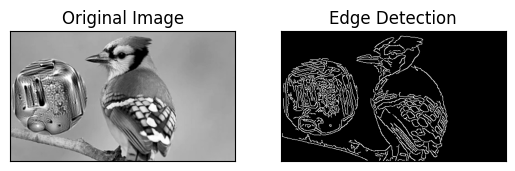

In [ ]:
# import cv2
# import numpy as np
# from matplotlib import pyplot as plt

# def edge_detection(image_path):
#     # Read the image
#     original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

#     # Apply Gaussian blur to the image to reduce noise and improve edge detection
#     blurred_image = cv2.GaussianBlur(original_image, (5, 5), 0)

#     # Use Canny edge detector to find edges in the image
#     edges = cv2.Canny(blurred_image, 50, 150)

#     # Display the original and edge-detected images side by side
#     plt.subplot(121), plt.imshow(original_image, cmap='gray')
#     plt.title('Original Image'), plt.xticks([]), plt.yticks([])
#     plt.subplot(122), plt.imshow(edges, cmap='gray')
#     plt.title('Edge Detection'), plt.xticks([]), plt.yticks([])

#     # Show the plots
#     plt.show()

# # Replace 'path/to/your/image.jpg' with the actual path to your image file
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# edge_detection(image_path)


In [ ]:
# import cv2
# import numpy as np
# from matplotlib import pyplot as plt

# def extract_and_save_outer_contour(image_path, save_path):
#     # Read the image in grayscale
#     original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

#     # Apply Gaussian blur to the image to reduce noise and improve contour detection
#     blurred_image = cv2.GaussianBlur(original_image, (5, 5), 0)

#     # Use Canny edge detector to find edges in the image
#     edges = cv2.Canny(blurred_image, 50, 150)

#     # Find contours in the edged image
#     contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     # Create an empty image to draw contours
#     contour_image = np.zeros_like(original_image)

#     # Draw the outer contours on the empty image
#     cv2.drawContours(contour_image, contours, -1, (255, 255, 255), 2)

#     # Save the image with the outer contour
#     cv2.imwrite(save_path, contour_image)

# # Replace 'path/to/your/image.jpg' with the actual path to your image file
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# save_path = '/content/extracted_outer_contour.png'
# extract_and_save_outer_contour(image_path, save_path)


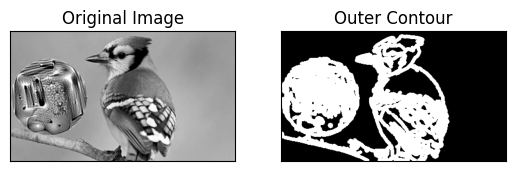

In [ ]:
# import cv2
# import numpy as np
# from matplotlib import pyplot as plt

# def extract_and_save_outer_contour(image_path, save_path):
#     # Read the image in grayscale
#     original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

#     # Apply Gaussian blur to the image to reduce noise and improve contour detection
#     blurred_image = cv2.GaussianBlur(original_image, (5, 5), 0)

#     # Use Canny edge detector to find edges in the image
#     edges = cv2.Canny(blurred_image, 50, 150)

#     # Find contours in the edged image
#     contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     # Create an empty image to draw contours
#     contour_image = np.zeros_like(original_image)

#     # Draw the outer contours on the empty image with thicker lines
#     cv2.drawContours(contour_image, contours, -1, (255, 255, 255), thickness=5)

#     # Display the original image and the outer contour image side by side
#     plt.subplot(121), plt.imshow(original_image, cmap='gray')
#     plt.title('Original Image'), plt.xticks([]), plt.yticks([])
#     plt.subplot(122), plt.imshow(contour_image, cmap='gray')
#     plt.title('Outer Contour'), plt.xticks([]), plt.yticks([])

#     # Save the image with the outer contour
#     cv2.imwrite(save_path, contour_image)

#     # Show the plots
#     plt.show()

# # Replace 'path/to/your/image.jpg' with the actual path to your image file
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# save_path = '/content/extracted_outer_contour.png'
# extract_and_save_outer_contour(image_path, save_path)


In [ ]:
# import tensorflow as tf

# from tensorflow.python.framework import ops
# from tensorflow.python.ops import gen_nn_ops

# @ops.RegisterGradient("GuidedRelu")
# def _GuidedReluGrad(op, grad):
#     return tf.where(0. < grad, gen_nn_ops._relu_grad(grad, op.outputs[0]), tf.zeros_like(grad))

In [ ]:
pip install nets


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.2/71.2 kB 993.7 kB/s eta 0:00:00


In [ ]:
pip install tf-keras-vis


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.1/52.1 kB 586.6 kB/s eta 0:00:00


Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_14 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_14[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

1/1 [==============================] - 2s 2s/step


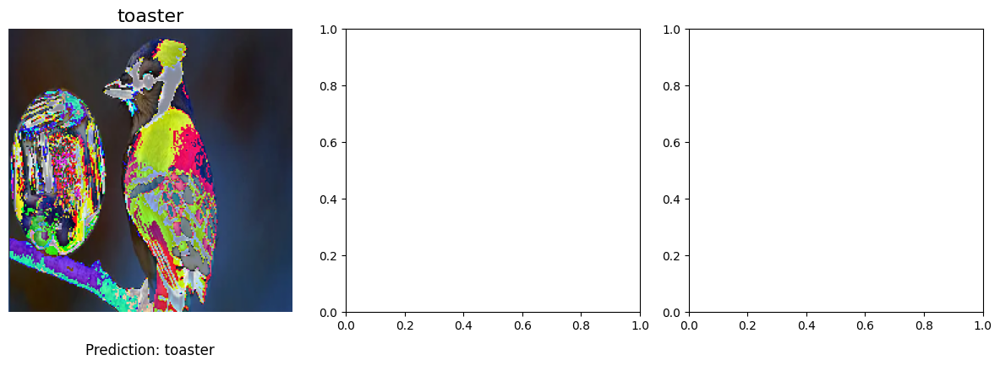

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

# Load ResNet50 model
model = ResNet50(weights='imagenet', include_top=True)
model.summary()

# Image titles
image_titles = ['toaster']

# Load images and convert them to a Numpy array
img1 = load_img('/content/Screenshot 2023-11-25 125630.png', target_size=(224, 224))

images = np.asarray([img_to_array(img1)])

# Preparing input data for ResNet50
X = preprocess_input(images)

# Make predictions
predictions = model.predict(X)

# Decode predictions
decoded_predictions = decode_predictions(predictions)

# Rendering
f, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, title in enumerate(image_titles):
    ax[i].set_title(title, fontsize=16)
    ax[i].imshow(images[i].astype(np.uint8))  # Convert to uint8 for proper display
    ax[i].axis('off')
    ax[i].text(0.5, -0.15, f"Prediction: {decoded_predictions[i][0][1]}", size=12, ha="center", transform=ax[i].transAxes)
plt.tight_layout()
plt.show()


<ipython-input-50-a813c7bca12b>:35: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  dilated_white_box = binary_dilation(white_box, selem=disk(1))
<ipython-input-50-a813c7bca12b>:38: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  inpainted_region = inpaint.inpaint_biharmonic(


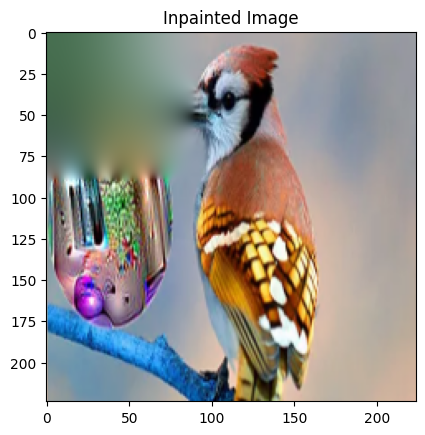

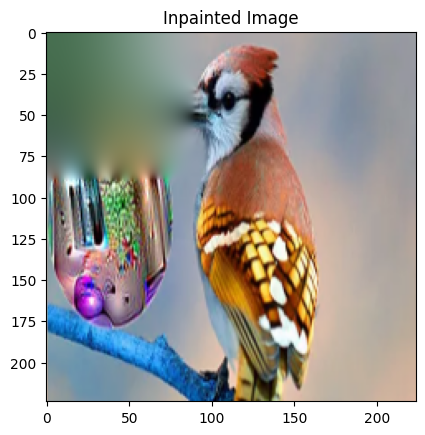

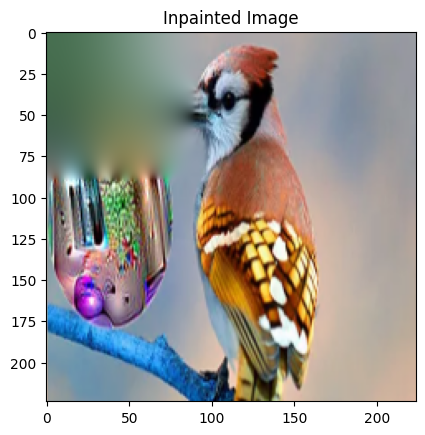

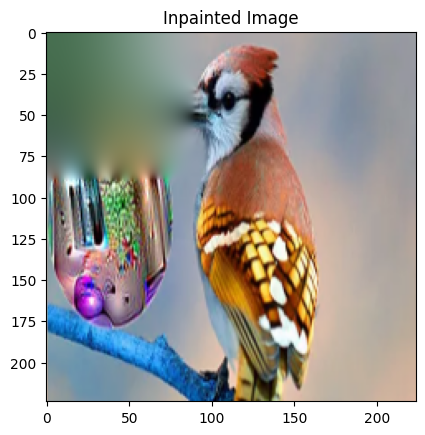

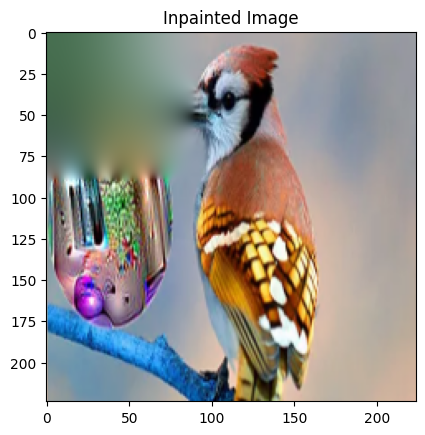

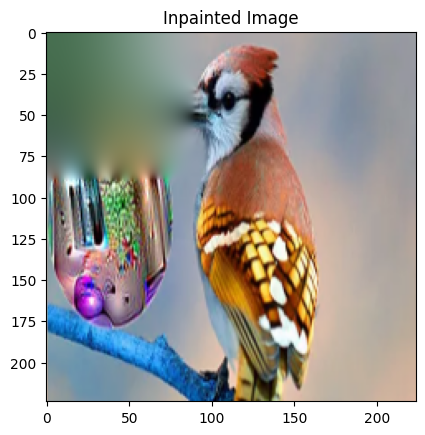

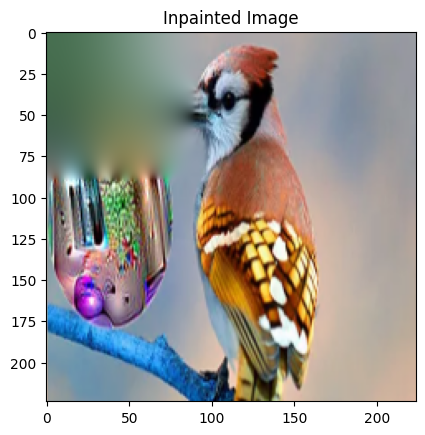

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.restoration import inpaint
# from skimage.morphology import disk, binary_dilation
# import matplotlib.image as mpimg

# # Load the image
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# image_orig = mpimg.imread(image_path)

# # Function to create a white box at the top-left corner of the image
# def create_white_box(image, box_size):
#     white_box = np.zeros_like(image, dtype=np.uint8)
#     white_box[:box_size, :box_size] = 255
#     return white_box

# # Resize the image to 224x224 (ResNet-50 input size)
# image_resized = cv2.resize(image_orig, (224, 224))

# # Create a copy to inpaint
# inpainted_image = image_resized.copy()

# # Display parameters
# box_size_cm = 8
# box_size_pixels = int(box_size_cm * 224 / 20)  # Assuming 20 cm is the original image size
# display_interval = 20

# # Inpainting process
# for step in range(0, 224 - box_size_pixels, 10):
#     # Create a white box at the top left corner
#     white_box = create_white_box(image_resized[:, :, 0], box_size_pixels)

#     # Perform binary dilation to move the box
#     dilated_white_box = binary_dilation(white_box, selem=disk(1))

#     # Perform inpainting on the region using OpenCV
#     inpainted_region = inpaint.inpaint_biharmonic(
#         inpainted_image, dilated_white_box.astype(np.uint8), multichannel=True
#     )

#     # Update the inpainted image with the region
#     inpainted_image = inpainted_region.copy()

#     # Display the inpainted image every 20 steps
#     if step % display_interval == 0:
#         plt.imshow(cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB))
#         plt.title('Inpainted Image')
#         plt.show()


<ipython-input-78-7b8842564f30>:43: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  dilated_white_box = binary_dilation(white_box, selem=disk(1))
<ipython-input-78-7b8842564f30>:49: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  inpainted_region = inpaint.inpaint_biharmonic(


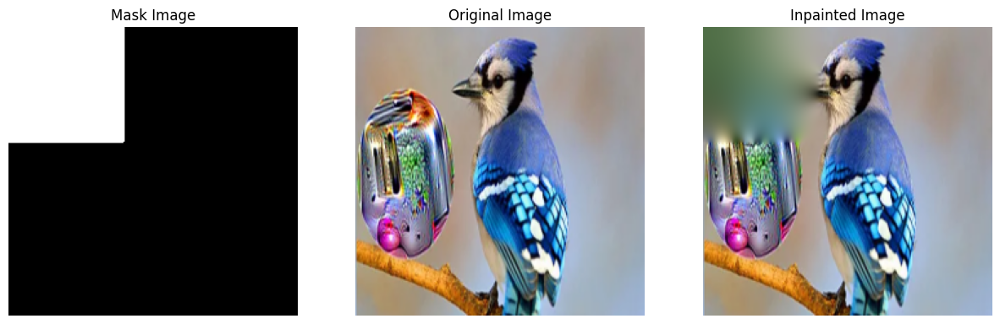

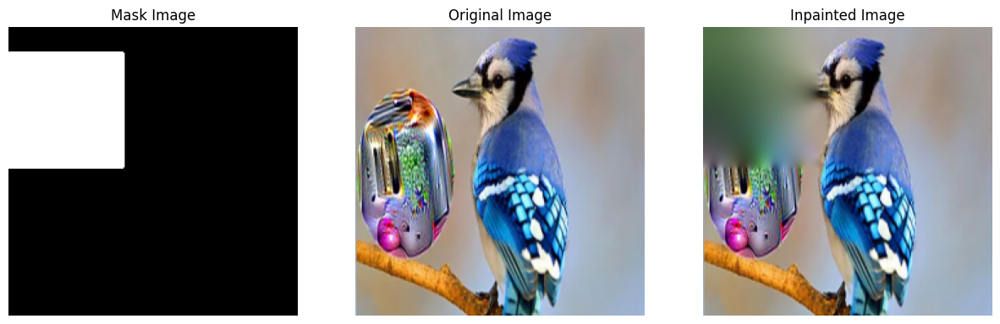

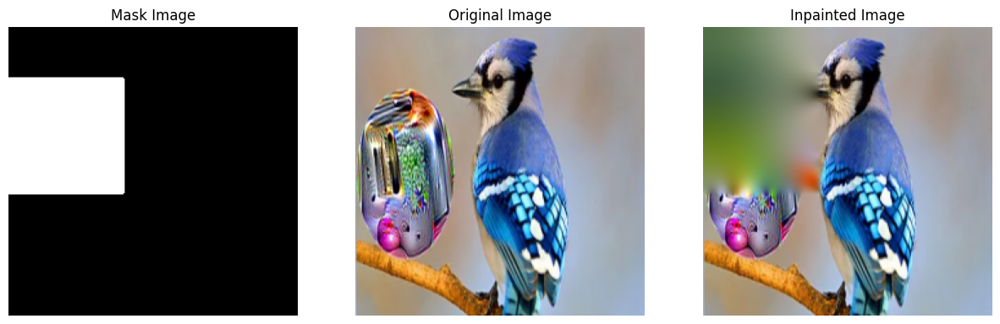

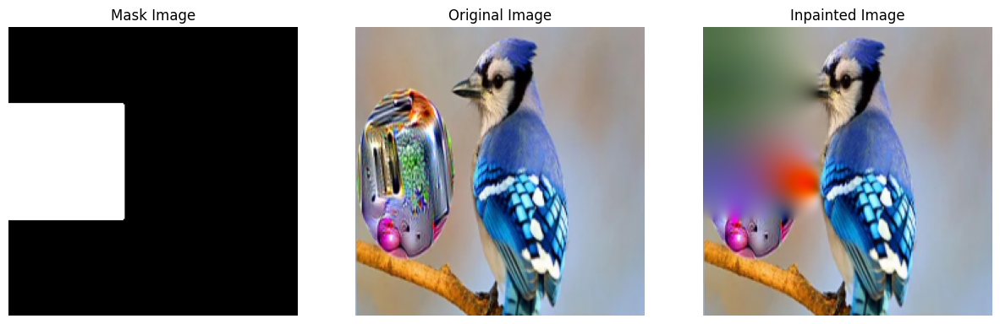

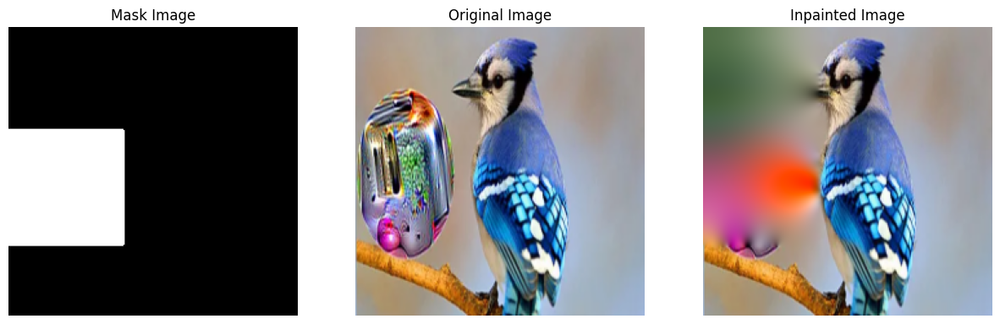

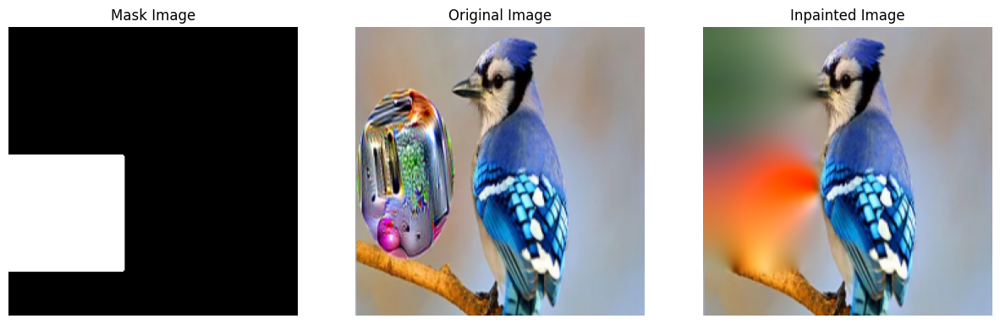

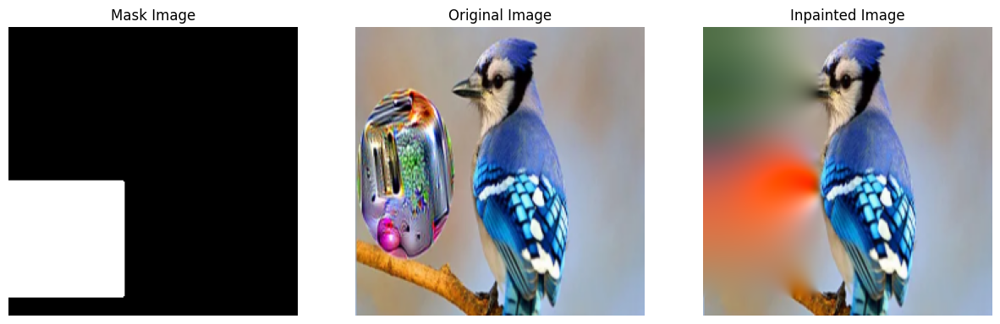

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.restoration import inpaint
# from skimage.morphology import binary_dilation, disk
# import matplotlib.image as mpimg

# # Load the image
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# image_orig = mpimg.imread(image_path)

# # Function to create a white box at a specified position
# def create_white_box(image, position, box_size):
#     white_box = np.zeros_like(image, dtype=np.uint8)
#     y, x = position
#     white_box[y:y + box_size, x:x + box_size] = 255
#     return white_box

# # Resize the image to 224x224 (ResNet-50 input size)
# image_resized = cv2.resize(image_orig, (224, 224))

# # Create a copy to inpaint
# inpainted_image = image_resized.copy()

# # Display parameters
# box_size_cm = 8
# box_size_pixels = int(box_size_cm * 224 / 20)  # Assuming 20 cm is the original image size
# display_interval = 20

# # Initialize a list to store the images for display
# images_to_display = []

# # Inpainting process
# for step in range(0, 224 - box_size_pixels, 10):
#     # Calculate the position for the white box
#     vertical_position = step
#     horizontal_position = (step // 224) * box_size_pixels

#     # Create a white box at the specified position
#     white_box = create_white_box(image_resized[:, :, 0], (vertical_position, horizontal_position), box_size_pixels)

#     # Perform binary dilation to move the box
#     dilated_white_box = binary_dilation(white_box, selem=disk(1))

#     # Store the mask image
#     mask_image = dilated_white_box.copy()

#     # Perform inpainting on the region using OpenCV
#     inpainted_region = inpaint.inpaint_biharmonic(
#         inpainted_image, dilated_white_box.astype(np.uint8), multichannel=True
#     )

#     # Update the inpainted image with the region
#     inpainted_image = inpainted_region.copy()

#     # Store images for display every 20 steps
#     if step % display_interval == 0:
#         images_to_display.append((mask_image, image_resized, inpainted_image))

# # Display the images in separate plots
# for i, (mask, original, inpainted) in enumerate(images_to_display):
#     plt.figure(figsize=(15, 5))

#     # Plot the mask image
#     plt.subplot(1, 3, 1)
#     plt.imshow(mask, cmap='gray')
#     plt.title('Mask Image')
#     plt.axis('off')

#     # Plot the original image
#     plt.subplot(1, 3, 2)
#     plt.imshow(original)
#     plt.title('Original Image')
#     plt.axis('off')

#     # Plot the inpainted image
#     plt.subplot(1, 3, 3)
#     plt.imshow(inpainted)
#     plt.title('Inpainted Image')
#     plt.axis('off')

#     plt.show()


<ipython-input-76-68202a857bad>:49: FutureWarning: `selem` is a deprecated argument name for `binary_dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  dilated_concentric_boxes = binary_dilation(concentric_boxes, selem=disk(1))
<ipython-input-76-68202a857bad>:52: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  inpainted_region = inpaint.inpaint_biharmonic(


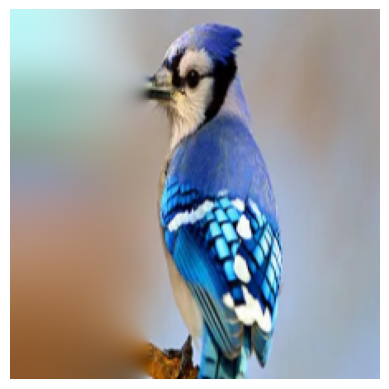

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.restoration import inpaint
# from skimage.morphology import binary_dilation, disk
# import matplotlib.image as mpimg

# # Load the image
# image_path = '/content/Screenshot 2023-11-25 125630.png'
# image_orig = mpimg.imread(image_path)

# # Function to create concentric white boxes at a specified position
# def create_concentric_boxes(image, position, box_size, num_levels):
#     white_boxes = np.zeros_like(image, dtype=np.uint8)

#     for level in range(num_levels):
#         y, x = position
#         current_box_size = box_size + level * 10
#         white_boxes[y:y + current_box_size, x:x + current_box_size] = 255

#     return white_boxes

# # Resize the image to 224x224 (ResNet-50 input size)
# image_resized = cv2.resize(image_orig, (224, 224))

# # Create a copy to inpaint
# inpainted_image = image_resized.copy()

# # Display parameters
# box_size_cm = 4
# box_size_pixels = int(box_size_cm * 224 / 20)  # Assuming 20 cm is the original image size
# display_interval = 20

# # Initialize variables to store the position
# vertical_position = 0
# horizontal_position = 0

# # Number of concentric boxes levels
# num_levels = 5

# # Inpainting process
# for step in range(0, 224 - box_size_pixels, 10):
#     # Create concentric white boxes at the specified position
#     concentric_boxes = create_concentric_boxes(
#         image_resized[:, :, 0], (vertical_position, horizontal_position), box_size_pixels, num_levels
#     )

#     # Perform binary dilation to move the boxes
#     dilated_concentric_boxes = binary_dilation(concentric_boxes, selem=disk(1))

#     # Perform inpainting on the region using OpenCV
#     inpainted_region = inpaint.inpaint_biharmonic(
#         inpainted_image, dilated_concentric_boxes.astype(np.uint8), multichannel=True
#     )

#     # Update the inpainted image with the region
#     inpainted_image = inpainted_region.copy()

#     # Update positions for the next iteration
#     vertical_position += 10  # Move vertically
#     if vertical_position >= 224 - box_size_pixels:
#         vertical_position = 0  # Reset vertical position
#         horizontal_position += 10  # Move horizontally

# # Save the last inpainted image
# plt.imshow(inpainted_image)
# plt.axis('off')
# plt.savefig('last_inpainted_image.png')
# plt.show()


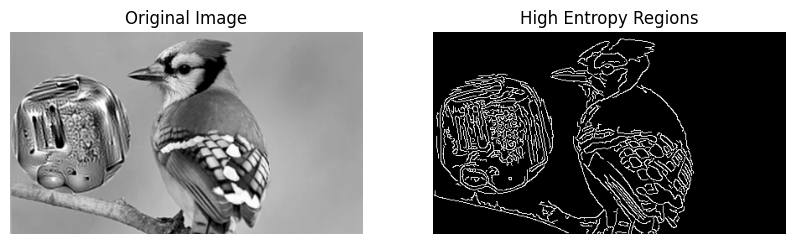

Low entropy region. Contains fewer edges and details.


In [5]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# def calculate_entropy(image):
#     hist = cv2.calcHist([image], [0], None, [256], [0, 256])
#     hist = hist / float(np.sum(hist))
#     entropy = -np.sum(hist * np.log2(hist + 1e-10))
#     return entropy

# def find_high_entropy_regions(image_path, threshold):
#     # Read the image
#     image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

#     # Apply GaussianBlur to reduce noise
#     blurred = cv2.GaussianBlur(image, (5, 5), 0)

#     # Apply Canny edge detection
#     edges = cv2.Canny(blurred, 50, 150)

#     # Create a mask based on the edges
#     mask = np.zeros_like(image)
#     mask[edges != 0] = 255

#     # Calculate entropy for the masked region
#     entropy = calculate_entropy(mask)

#     # Display the result using matplotlib
#     plt.figure(figsize=(10, 5))

#     plt.subplot(1, 2, 1)
#     plt.imshow(image, cmap='gray')
#     plt.title('Original Image')
#     plt.axis('off')

#     plt.subplot(1, 2, 2)
#     plt.imshow(mask, cmap='gray')
#     plt.title('High Entropy Regions')
#     plt.axis('off')

#     plt.show()

#     # Check if entropy is above the threshold
#     if entropy > threshold:
#         print("High entropy region detected. Contains many edges and details.")
#     else:
#         print("Low entropy region. Contains fewer edges and details.")

# # Set the image path and entropy threshold
# image_path = "/content/Screenshot 2023-11-25 125630.png"
# entropy_threshold = 4.0  # You may need to adjust this threshold based on your images

# # Find high entropy regions in the image
# find_high_entropy_regions(image_path, entropy_threshold)


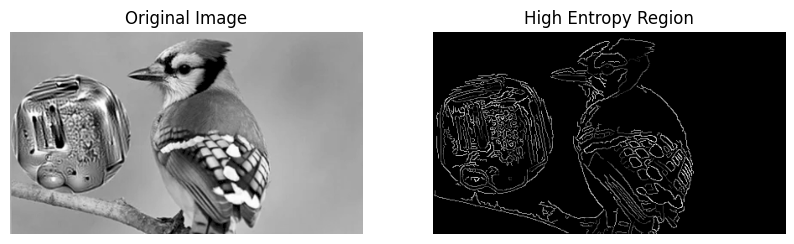

High entropy region saved as 'high_entropy_region.jpg'


In [11]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# def calculate_entropy(image):
#     hist = cv2.calcHist([image], [0], None, [256], [0, 256])
#     hist = hist / float(np.sum(hist))
#     entropy = -np.sum(hist * np.log2(hist + 1e-10))
#     return entropy

# def find_high_entropy_region(image_path, threshold):
#     # Read the image
#     image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

#     # Apply GaussianBlur to reduce noise
#     blurred = cv2.GaussianBlur(image, (5, 5), 0)

#     # Apply Canny edge detection
#     edges = cv2.Canny(blurred, 50, 150)

#     # Create a mask based on the edges
#     mask = np.zeros_like(image)
#     mask[edges != 0] = 255

#     # Calculate entropy for the masked region
#     entropy = calculate_entropy(mask)

#     # Check if entropy is above the threshold
#     if entropy > threshold:
#         # Extract the high entropy region from the original image
#         high_entropy_region = cv2.bitwise_and(image, image, mask=mask)

#         # Display the result using matplotlib
#         plt.figure(figsize=(10, 5))

#         plt.subplot(1, 2, 1)
#         plt.imshow(image, cmap='gray')
#         plt.title('Original Image')
#         plt.axis('off')

#         plt.subplot(1, 2, 2)
#         plt.imshow(high_entropy_region, cmap='gray')
#         plt.title('High Entropy Region')
#         plt.axis('off')

#         plt.show()

#         return high_entropy_region
#     else:
#         print("Low entropy region. Contains fewer edges and details.")
#         return None

# # Set the image path and entropy threshold
# image_path = "/content/Screenshot 2023-11-25 125630.png"
# entropy_threshold = 0.35 # You may need to adjust this threshold based on your images

# # Find and extract high entropy region in the image
# high_entropy_region = find_high_entropy_region(image_path, entropy_threshold)

# # Save the high entropy region as a new image
# if high_entropy_region is not None:
#     cv2.imwrite("high_entropy_region.jpg", high_entropy_region)
#     print("High entropy region saved as 'high_entropy_region.jpg'")


In [37]:
import cv2
import numpy as np

# Load the image
image_rgb = cv2.imread('/content/Screenshot 2023-11-25 125630.png')  # Replace 'your_image_path.jpg' with the actual image file path

# Provided bounding box coordinates
bounding_boxes = [
    [0, 10, 310, 230],
    [2, 199, 148, 40],
    [141, 10, 169, 230],
    [2, 155, 148, 84],
    [270, 227, 19, 12],
    [0, 138, 27, 44],
    [0, 52, 166, 185]
]

# Create a black mask
mask = np.zeros((image_rgb.shape[0], image_rgb.shape[1]), dtype=np.uint8)

# Draw white circles with a radius of 3 cm at the centers of bounding boxes
for bbox in bounding_boxes:
    x, y, w, h = bbox
    center_x = x + w // 2
    center_y = y + h // 2

    # Calculate the radius in pixels based on the assumption of 1 cm = 10 pixels
    radius_in_pixels = 3*10

    cv2.circle(mask, (center_x, center_y), radius_in_pixels, 255, -1)

# Save the mask
mask_path = 'maskingImage_3cm.png'
cv2.imwrite(mask_path, mask)

print(f"Mask saved at {mask_path}")


Mask saved at maskingImage_3cm.png


<ipython-input-38-9cb3bed32175>:21: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  image_result = inpaint.inpaint_biharmonic(image_defect, mask, multichannel=True)


Inpainted image saved at /content/inpainted_image3.png


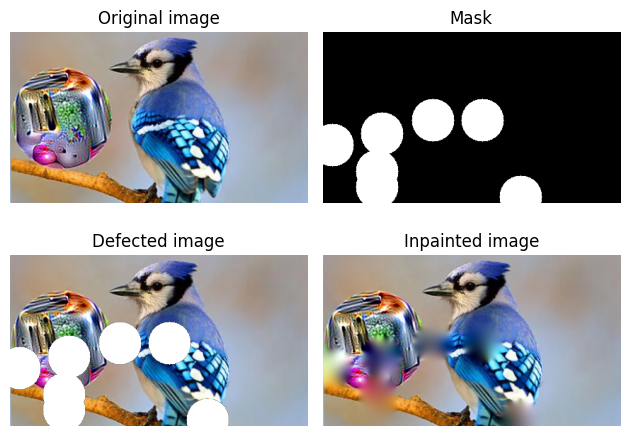

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import inpaint

# Load the original image with matplotlib
image_orig = plt.imread('/content/Screenshot 2023-11-25 125630.png')

# Load the mask image
mask_path = '/content/maskingImage_3cm.png'
mask_image = plt.imread(mask_path)

# Convert the mask to a boolean mask
mask = mask_image > 0

# Apply defect mask to the image over the same region in each color channel
image_defect = image_orig.copy()
for channel in range(image_defect.shape[-1]):
    image_defect[..., channel] *= ~mask

# Inpainting
# USE OUR INPAINTING
image_result = inpaint.inpaint_biharmonic(image_defect, mask, multichannel=True)

# Save the inpainted image using Matplotlib
inpainted_image_path = '/content/inpainted_image3.png'
plt.imsave(inpainted_image_path, image_result)
print(f"Inpainted image saved at {inpainted_image_path}")

# Plot the images
fig, axes = plt.subplots(ncols=2, nrows=2)
ax = axes.ravel()

ax[0].set_title('Original image')
ax[0].imshow(image_orig)

ax[1].set_title('Mask')
ax[1].imshow(mask, cmap=plt.cm.gray)

ax[2].set_title('Defected image')
ax[2].imshow(image_defect)

ax[3].set_title('Inpainted image')
ax[3].imshow(image_result)

for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()


<ipython-input-22-162a139af913>:21: FutureWarning: `multichannel` is a deprecated argument name for `inpaint_biharmonic`. It will be removed in version 1.0. Please use `channel_axis` instead.
  image_result = inpaint.inpaint_biharmonic(image_defect, mask, multichannel=True)


Inpainted image saved at /content/inpainted_image.png


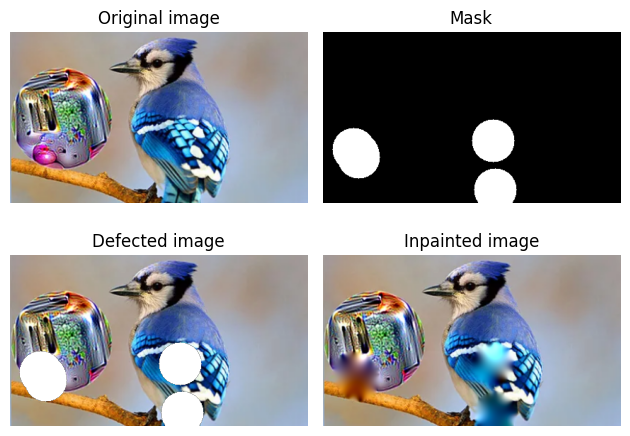

In [22]:
# import numpy as np
# import matplotlib.pyplot as plt
# from skimage.restoration import inpaint

# # Load the original image with matplotlib
# image_orig = plt.imread('/content/Screenshot 2023-11-25 125630.png')

# # Load the mask image
# mask_path = '/content/maskingImage_3cm.png'
# mask_image = plt.imread(mask_path)

# # Convert the mask to a boolean mask
# mask = mask_image > 0

# # Apply defect mask to the image over the same region in each color channel
# image_defect = image_orig.copy()
# for channel in range(image_defect.shape[-1]):
#     image_defect[..., channel] *= ~mask

# # Inpainting
# image_result = inpaint.inpaint_biharmonic(image_defect, mask, multichannel=True)

# # Save the inpainted image
# inpainted_image_path = '/content/inpainted_image.png'
# plt.imsave(inpainted_image_path, image_result)

# print(f"Inpainted image saved at {inpainted_image_path}")

# # Display the result
# fig, axes = plt.subplots(ncols=2, nrows=2)
# ax = axes.ravel()

# ax[0].set_title('Original image')
# ax[0].imshow(image_orig)

# ax[1].set_title('Mask')
# ax[1].imshow(mask, cmap=plt.cm.gray)

# ax[2].set_title('Defected image')
# ax[2].imshow(image_defect)

# ax[3].set_title('Inpainted image')
# ax[3].imshow(image_result)

# for a in ax:
#     a.axis('off')

# fig.tight_layout()
# plt.show()


In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk, binary_dilation
from skimage.restoration import inpaint
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

# Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted_image.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)

# Load pre-trained ResNet-50 model
resnet_model = ResNet50(weights='imagenet')

# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")


1/1 [==============================] - 1s 775ms/step
Top 4 predictions:
1: toaster (0.63)
2: brambling (0.10)
3: partridge (0.05)
4: soap_dispenser (0.04)


In [24]:
# import cv2
# import numpy as np

# # Provided center coordinates
# center_coordinates = [
#     (203.5, 124.5), (254.5, 168.0), (102.0, 213.5), (257.5, 141.0), (261.0, 216.0),
#     (216.5, 128.5), (196.0, 134.0), (240.5, 145.0), (239.5, 189.5), (232.5, 155.0),
#     (234.5, 226.5), (244.5, 133.5), (241.0, 169.5), (273.0, 159.5), (198.5, 44.5),
#     (231.0, 134.0), (224.5, 143.0), (250.0, 127.0), (282.0, 182.0), (277.5, 218.0),
#     (172.5, 150.5), (235.5, 125.5), (247.0, 156.5), (287.0, 172.5), (249.5, 185.5),
#     (189.5, 229.5), (17.0, 233.5), (270.5, 132.0), (154.0, 49.5), (299.0, 181.0),
#     (121.5, 201.5), (214.0, 75.0), (226.0, 126.0), (175.5, 224.0)
# ]

# # Create a black mask
# mask = np.zeros((300, 400), dtype=np.uint8)

# # Draw white circles with a radius of 1 cm at the specified center coordinates
# for center_x, center_y in center_coordinates:
#     # Convert center coordinates to integers
#     center_x, center_y = int(center_x), int(center_y)

#     # Calculate the radius in pixels based on the assumption of 1 cm = 10 pixels
#     radius_in_pixels = 1 * 10

#     cv2.circle(mask, (center_x, center_y), radius_in_pixels, 255, -1)

# # Save the mask
# mask_path = '/content/allmask.png'
# cv2.imwrite(mask_path, mask)

# print(f"Binary mask saved at {mask_path}")


Binary mask saved at /content/allmask.png


In [25]:
# import cv2
# import numpy as np

# # Provided center coordinates
# center_coordinates = [
#     (203.5, 124.5), (254.5, 168.0), (102.0, 213.5), (257.5, 141.0), (261.0, 216.0),
#     (216.5, 128.5), (196.0, 134.0), (240.5, 145.0), (239.5, 189.5), (232.5, 155.0),
#     (234.5, 226.5), (244.5, 133.5), (241.0, 169.5), (273.0, 159.5), (198.5, 44.5),
#     (231.0, 134.0), (224.5, 143.0), (250.0, 127.0), (282.0, 182.0), (277.5, 218.0),
#     (172.5, 150.5), (235.5, 125.5), (247.0, 156.5), (287.0, 172.5), (249.5, 185.5),
#     (189.5, 229.5), (17.0, 233.5), (270.5, 132.0), (154.0, 49.5), (299.0, 181.0),
#     (121.5, 201.5), (214.0, 75.0), (226.0, 126.0), (175.5, 224.0)
# ]

# # Create a black mask
# mask = np.zeros((300, 400), dtype=np.uint8)

# # Draw white circles with a radius of 1 cm at the specified center coordinates, avoiding overlap
# for center_x, center_y in center_coordinates:
#     # Convert center coordinates to integers
#     center_x, center_y = int(center_x), int(center_y)

#     # Calculate the radius in pixels based on the assumption of 1 cm = 10 pixels
#     radius_in_pixels = 1 * 10

#     # Check if the pixel has already been set to 255 (white)
#     if mask[center_y, center_x] != 255:
#         cv2.circle(mask, (center_x, center_y), radius_in_pixels, 255, -1)

# # Save the mask
# mask_path = '/content/allmask_no_overlap.png'
# cv2.imwrite(mask_path, mask)

# print(f"Binary mask without overlap saved at {mask_path}")


Binary mask without overlap saved at /content/allmask_no_overlap.png


In [27]:
# import cv2
# import numpy as np

# # Provided center coordinates
# center_coordinates = [
#     (203.5, 124.5), (254.5, 168.0), (102.0, 213.5), (257.5, 141.0), (261.0, 216.0),
#     (216.5, 128.5), (196.0, 134.0), (240.5, 145.0), (239.5, 189.5), (232.5, 155.0),
#     (234.5, 226.5), (244.5, 133.5), (241.0, 169.5), (273.0, 159.5), (198.5, 44.5),
#     (231.0, 134.0), (224.5, 143.0), (250.0, 127.0), (282.0, 182.0), (277.5, 218.0),
#     (172.5, 150.5), (235.5, 125.5), (247.0, 156.5), (287.0, 172.5), (249.5, 185.5),
#     (189.5, 229.5), (17.0, 233.5), (270.5, 132.0), (154.0, 49.5), (299.0, 181.0),
#     (121.5, 201.5), (214.0, 75.0), (226.0, 126.0), (175.5, 224.0)
# ]

# # Create a black mask
# mask = np.zeros((300, 400), dtype=np.uint8)

# # Define the area for checking overlapping circles (x, y, width, height)
# check_area = (200, 100, 50, 50)

# # Draw white circles with a radius of 1 cm at the specified center coordinates, avoiding overlap within the check area
# for center_x, center_y in center_coordinates:
#     # Convert center coordinates to integers
#     center_x, center_y = int(center_x), int(center_y)

#     # Check if the circle is within the specified area
#     if check_area[0] <= center_x <= check_area[0] + check_area[2] and check_area[1] <= center_y <= check_area[1] + check_area[3]:
#         # Check if the pixel has already been set to 255 (white)
#         if mask[center_y, center_x] != 255:
#             cv2.circle(mask, (center_x, center_y), 10, 255, -1)
#     else:
#         # Draw circles outside the specified area without checking for overlap
#         cv2.circle(mask, (center_x, center_y), 10, 255, -1)

# # Save the mask
# mask_path = '/content/allmaskverlap_area.png'
# cv2.imwrite(mask_path, mask)

# print(f"Binary mask without overlap in the specified area saved at {mask_path}")


Binary mask without overlap in the specified area saved at /content/allmaskverlap_area.png


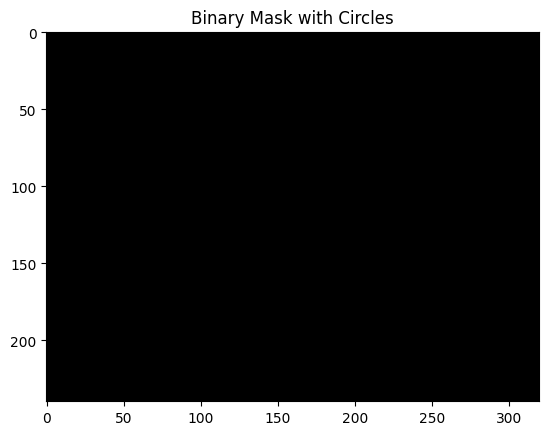

Mask saved at /content/circle_mask.png


In [2]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Provided bounding box coordinates
# bounding_boxes = [
#     [0, 10, 310, 230],
#     [2, 199, 148, 40],
#     [141, 10, 169, 230],
#     [2, 155, 148, 84],
#     [270, 227, 19, 12],
#     [0, 138, 27, 44],
#     [0, 52, 166, 185]
# ]

# # Assuming image size for reference
# image_height, image_width = 240, 320

# # Create a black mask
# mask = np.zeros((image_height, image_width), dtype=np.uint8)

# # Draw white circles at the centers of bounding boxes
# for bbox in bounding_boxes:
#     x, y, w, h = bbox
#     center_x = x + w // 2
#     center_y = y + h // 2

#     # Convert from cm to pixels (assuming 1 cm = 10 pixels)
#     center_x_pixels = int(center_x * 10)
#     center_y_pixels = int(center_y * 10)

#     # Draw a white circle (255) with a 2 cm diameter
#     cv2.circle(mask, (center_x_pixels, center_y_pixels), 20, 255, -1)

# # Display the mask
# plt.imshow(mask, cmap='gray')
# plt.title('Binary Mask with Circles')
# plt.show()

# # Save the mask
# mask_path = '/content/circle_mask.png'
# cv2.imwrite(mask_path, mask)

# print(f"Mask saved at {mask_path}")


In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import disk, binary_dilation
from skimage.restoration import inpaint
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions



# Load pre-trained ResNet-50 model
resnet_model = ResNet50(weights='imagenet')




35363/35363 [==============================] - 0s 0us/step
Top 4 predictions:
1: toaster (0.77)
2: soap_dispenser (0.06)
3: piggy_bank (0.02)
4: partridge (0.02)


In [30]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted_image2.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 342ms/step
Top 4 predictions:
1: brambling (0.20)
2: jay (0.15)
3: bee_eater (0.08)
4: toaster (0.05)


In [34]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted_image4with5.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 1s 606ms/step
Top 4 predictions:
1: toaster (0.53)
2: brambling (0.08)
3: jay (0.06)
4: partridge (0.05)


In [35]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted_image5with5.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 341ms/step
Top 4 predictions:
1: toaster (0.18)
2: brambling (0.14)
3: jay (0.09)
4: partridge (0.05)


In [36]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/inpainted_image6with5.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 317ms/step
Top 4 predictions:
1: brambling (0.20)
2: jay (0.15)
3: bee_eater (0.08)
4: toaster (0.05)


In [41]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/Screenshot 2023-11-25 125630.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 342ms/step
Top 4 predictions:
1: toaster (0.68)
2: soap_dispenser (0.09)
3: piggy_bank (0.03)
4: partridge (0.02)


In [42]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/Screenshot 2023-11-25 125606.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 355ms/step
Top 4 predictions:
1: jay (0.58)
2: bee_eater (0.12)
3: brambling (0.06)
4: partridge (0.05)


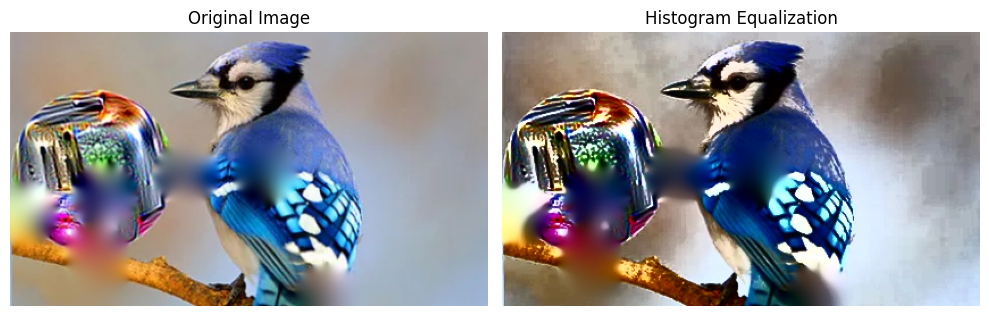

In [49]:
# EXPTERIMENT 1

import cv2
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/inpainted_image2.png')  # Replace 'bird_image.jpg' with the actual image file path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the RGB image to YUV color space
image_yuv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2YUV)

# Apply Histogram Equalization to the Y channel
image_yuv[:, :, 0] = cv2.equalizeHist(image_yuv[:, :, 0])

# Convert the YUV image back to RGB
image_equalized = cv2.cvtColor(image_yuv, cv2.COLOR_YUV2RGB)

# Display the original and equalized images using plt.imshow
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')

axes[1].imshow(image_equalized)
axes[1].set_title('Histogram Equalization')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()

# Save the equalized image using plt.savefig
inpainted_image_path = '/content/histogram.png'
plt.imsave(inpainted_image_path, image_equalized)


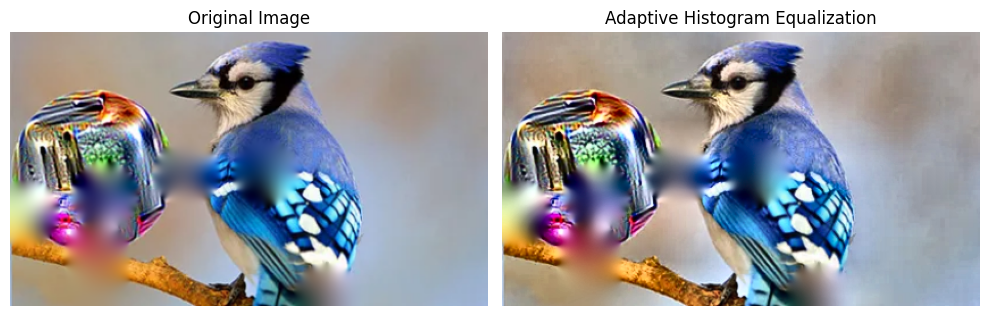

In [51]:
# EXPTERIMENT 2

import cv2
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/inpainted_image2.png')  # Replace 'inpainted_image2.png' with the actual image file path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the RGB image to LAB color space
image_lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)

# Extract the L channel (luminance) from LAB
l_channel = image_lab[:, :, 0]

# Apply Adaptive Histogram Equalization
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
l_channel_equalized = clahe.apply(l_channel)

# Replace the equalized L channel in LAB
image_lab[:, :, 0] = l_channel_equalized

# Convert the LAB image back to RGB
image_equalized = cv2.cvtColor(image_lab, cv2.COLOR_LAB2RGB)

# Display the original and equalized images
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')

axes[1].imshow(image_equalized)
axes[1].set_title('Adaptive Histogram Equalization')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()
inpainted_image_path = '/content/adaptivehistogram.png'
plt.imsave(inpainted_image_path, image_equalized)

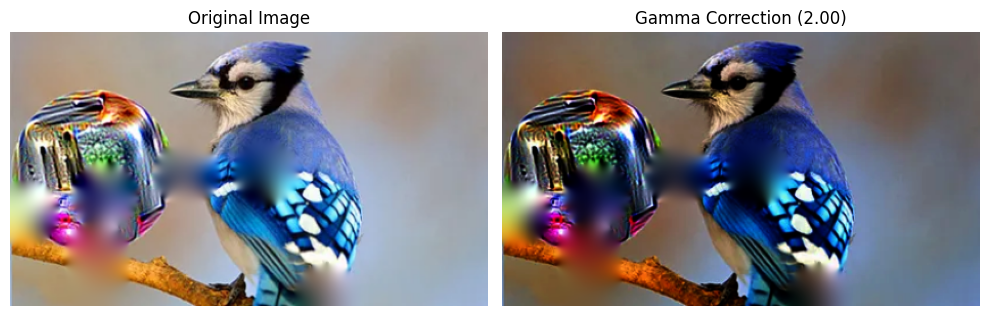

In [58]:
# EXPTERIMENT 3


import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image
image = cv2.imread('/content/inpainted_image2.png')  # Replace 'inpainted_image2.png' with the actual image file path
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply gamma correction
gamma_value = 2 # Adjust this value based on your preference
gamma_corrected = np.power(image_rgb / 255.0, gamma_value)
gamma_corrected = (gamma_corrected * 255).astype(np.uint8)

# Display the original and gamma-corrected images
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(image_rgb)
axes[0].set_title('Original Image')

axes[1].imshow(gamma_corrected)
axes[1].set_title(f'Gamma Correction ({gamma_value:.2f})')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()
inpainted_image_path = '/content/gamma_corrected2.png'
plt.imsave(inpainted_image_path, gamma_corrected)

<ipython-input-62-bc72e9abd8a7>:10: FutureWarning: `multichannel` is a deprecated argument name for `denoise_tv_chambolle`. It will be removed in version 1.0. Please use `channel_axis` instead.
  denoised_image_color = restoration.denoise_tv_chambolle(image_rgb, weight=0.1, multichannel=True)


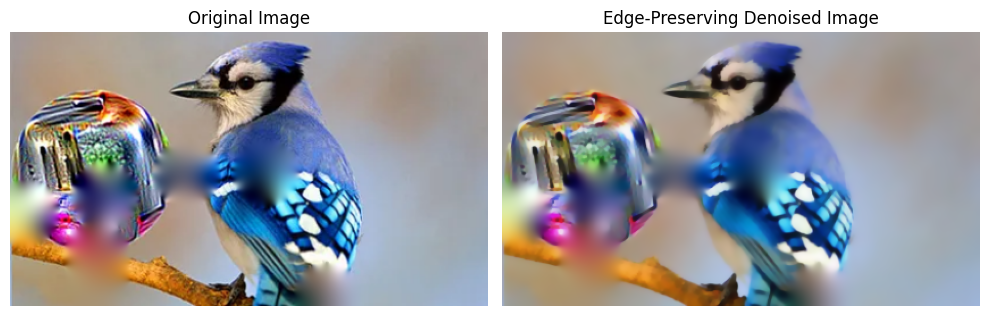

In [62]:
# import cv2
# import matplotlib.pyplot as plt
# from skimage import restoration

# # Load the image
# image = cv2.imread('/content/inpainted_image2.png')  # Replace 'inpainted_image2.png' with the actual image file path
# image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# # Perform anisotropic diffusion for edge-preserving smoothing on the color image
# denoised_image_color = restoration.denoise_tv_chambolle(image_rgb, weight=0.1, multichannel=True)

# # Display the original and denoised images
# fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# axes[0].imshow(image_rgb)
# axes[0].set_title('Original Image')

# axes[1].imshow(denoised_image_color)
# axes[1].set_title('Edge-Preserving Denoised Image')

# for ax in axes:
#     ax.axis('off')

# plt.tight_layout()
# plt.show()
# inpainted_image_path = '/content/Edge-Preserving Denoised Image.png'
# plt.imsave(inpainted_image_path, denoised_image_color)

In [70]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/adaptivehistogram.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 214ms/step
Top 4 predictions:
1: jay (0.44)
2: brambling (0.06)
3: partridge (0.03)
4: fountain (0.03)


In [71]:
# # Step 1: Use ResNet-50 for image classification
# image_path = '/content/gamma_corrected1.5.png'
# image_orig = cv2.imread(image_path)
# image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# # Preprocess the image for ResNet-50
# image_resized = np.expand_dims(image_resized, axis=0)
# image_resized = preprocess_input(image_resized)
# # Get predictions
# predictions = resnet_model.predict(image_resized)
# decoded_predictions = decode_predictions(predictions, top=4)[0]

# # Display top 4 predictions
# print("Top 4 predictions:")
# for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
#     print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 413ms/step
Top 4 predictions:
1: bee_eater (0.16)
2: jay (0.13)
3: brambling (0.13)
4: jacamar (0.03)


In [72]:
# Step 1: Use ResNet-50 for image classification
image_path = '/content/gamma_corrected2.5.png'
image_orig = cv2.imread(image_path)
image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# Preprocess the image for ResNet-50
image_resized = np.expand_dims(image_resized, axis=0)
image_resized = preprocess_input(image_resized)
# Get predictions
predictions = resnet_model.predict(image_resized)
decoded_predictions = decode_predictions(predictions, top=4)[0]

# Display top 4 predictions
print("Top 4 predictions:")
for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
    print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 268ms/step
Top 4 predictions:
1: jay (0.21)
2: bee_eater (0.16)
3: macaw (0.06)
4: quail (0.05)


In [74]:
# # Step 1: Use ResNet-50 for image classification
# image_path = '/content/histogram.png'
# image_orig = cv2.imread(image_path)
# image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# # Preprocess the image for ResNet-50
# image_resized = np.expand_dims(image_resized, axis=0)
# image_resized = preprocess_input(image_resized)
# # Get predictions
# predictions = resnet_model.predict(image_resized)
# decoded_predictions = decode_predictions(predictions, top=4)[0]

# # Display top 4 predictions
# print("Top 4 predictions:")
# for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
#     print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 1s 674ms/step
Top 4 predictions:
1: jay (0.08)
2: fountain (0.07)
3: perfume (0.06)
4: quail (0.04)


In [75]:
# # Step 1: Use ResNet-50 for image classification
# image_path = '/content/histogram.png'
# image_orig = cv2.imread(image_path)
# image_resized = cv2.resize(image_orig, (224, 224))  # ResNet-50 input size

# # Preprocess the image for ResNet-50
# image_resized = np.expand_dims(image_resized, axis=0)
# image_resized = preprocess_input(image_resized)
# # Get predictions
# predictions = resnet_model.predict(image_resized)
# decoded_predictions = decode_predictions(predictions, top=4)[0]

# # Display top 4 predictions
# print("Top 4 predictions:")
# for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
#     print(f"{i + 1}: {label} ({score:.2f})")

1/1 [==============================] - 0s 213ms/step
Top 4 predictions:
1: jay (0.08)
2: fountain (0.07)
3: perfume (0.06)
4: quail (0.04)
